In [ ]:
pip install tensorflow keras newsapi-python

In [ ]:
import cv2
import os
import numpy as np
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from newsapi import NewsApiClient

In [ ]:
# News API key
newsapi = NewsApiClient(api_key='f75832935bce41c8aaa319f2aec14416')

In [ ]:
def fetch_articles(person_name):
    articles = newsapi.get_everything(q=person_name, language='en', sort_by='relevancy')
    return articles['articles']

In [ ]:
def detect_and_recognize_faces(image_array):
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.3, minNeighbors=5)
    return faces, image_array

In [ ]:
def build_lstm_model(vocab_size, max_len):
    model = Sequential()
    model.add(Embedding(vocab_size, 128, input_length=max_len))
    model.add(Bidirectional(LSTM(64, return_sequences=True)))
    model.add(GlobalMaxPooling1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [13]:
def summarize_text_with_lstm(texts):
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(texts)
    total_words = len(tokenizer.word_index) + 1

    input_sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(input_sequences, padding='post')

    model = build_lstm_model(total_words, padded_sequences.shape[1])

    # Train the model (you may need labeled data for training)
    # For illustration purposes, this is a dummy example
    labels = np.random.choice([0, 1], size=len(texts))
    model.fit(padded_sequences, labels, epochs=5, verbose=0)

    # For each text, predict the sentiment (dummy result)
    predictions = model.predict(padded_sequences)

    # Summarize the text based on sentiment (dummy example)
    summarized_texts = [text for text in texts]

    return summarized_texts

Enter the person's name: Connor bedard
1/1 [==============================] - 1s 801ms/step


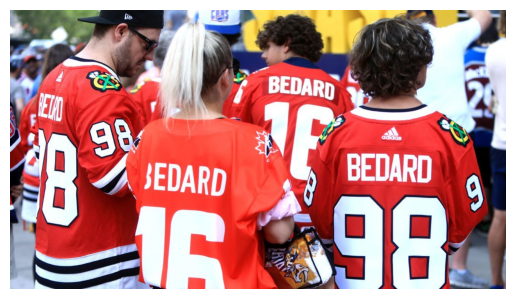

Published Date: 2024-03-01T18:48:14Z

Title: Blackhawks boon: Bedard leads NHL jersey sales

Summarized Texts:
- Chicago Blackhawks rookie sensation Connor Bedard has the top selling jersey in the NHL this season, according to Fanatics, adding even more benefits that Bedards is bringing the Blackhawks.
URL: https://www.espn.com/nhl/story/_/id/39632170/rookie-connor-bedard-leads-nhl-jersey-sales
--------------------------------------------------

1/1 [==============================] - 1s 861ms/step


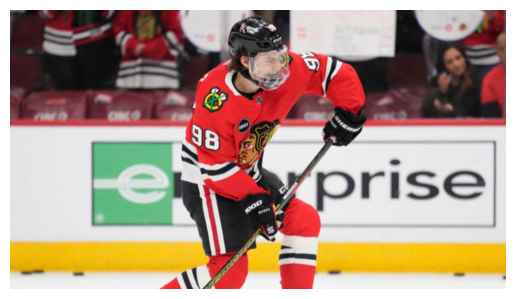

Published Date: 2024-03-14T13:29:56Z

Title: NHL Star Power Index: Connor Bedard embarking on historic stretch, Kirill Kaprizov scoring at lofty pace

Summarized Texts:
- Bowen Byram is also thriving with his new team
URL: https://www.cbssports.com/nhl/news/nhl-star-power-index-connor-bedard-embarking-on-historic-stretch-kirill-kaprizov-scoring-at-lofty-pace/
--------------------------------------------------

1/1 [==============================] - 1s 853ms/step


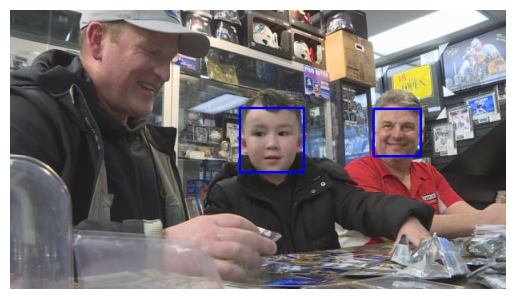

Published Date: 2024-03-12T00:57:57Z

Title: Collectors on the hunt for rare Connor Bedard rookie card

Summarized Texts:
- Metro Vancouver hobby shops say hockey cards are flying off the shelves as collectors search for a one-of-a-kind Connor Bedard rookie card. A U.S. collectibles company posted a bounty of $1 million U.S. in exchange for the specialty card.
URL: https://www.cbc.ca/news/canada/british-columbia/hockey-card-connor-bedard-1.7140600
--------------------------------------------------

1/1 [==============================] - 1s 776ms/step


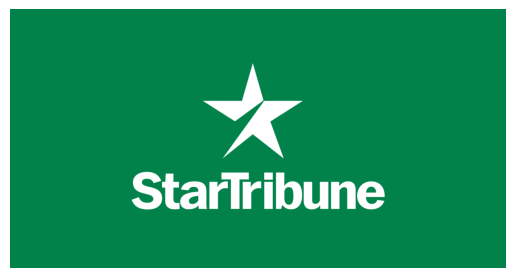

Published Date: 2024-03-11T01:01:01Z

Title: Blackwell and Bedard help the Blackhawks knock off the Coyotes 7-4

Summarized Texts:
- Colin Blackwell got his first career hat trick and Connor Bedard had two goals and an assist, leading the Chicago Blackhawks to a 7-4 victory over the Arizona Coyotes on Sunday night.
URL: https://www.startribune.com/blackwell-and-bedard-help-the-blackhawks-knock-off-the-coyotes-7-4/600349981/
--------------------------------------------------

No image available for this article.
No image available for this article.
1/1 [==============================] - 1s 922ms/step


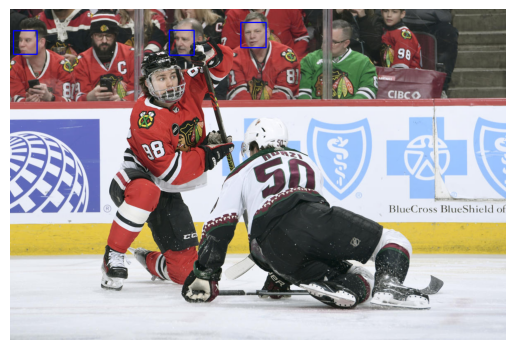

Published Date: 2024-03-11T02:27:00Z

Title: Blackhawks' Connor Bedard comes so close to recording first NHL hat trick

Summarized Texts:
- Everybody in the building wanted Connor Bedard to complete the hat trick on Sunday but he fell just short.
URL: https://www.nbcsportschicago.com/nhl/chicago-blackhawks/blackhawks-connor-bedard-comes-so-close-to-recording-first-nhl-hat-trick/545921/?partner=yahoo
--------------------------------------------------

1/1 [==============================] - 1s 771ms/step


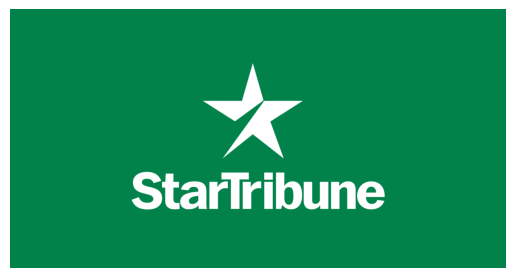

Published Date: 2024-03-13T03:25:00Z

Title: Connor Bedard has goal, 4 assists for single-game point high as Blackhawks beat Ducks 7-2

Summarized Texts:
- Connor Bedard had a goal and four assists to set his single-game high in points, Philipp Kurashev scored twice and had two assists, and the Chicago Blackhawks beat the Anaheim Ducks 7-2 on Tuesday night.
URL: https://www.startribune.com/connor-bedard-has-goal-4-assists-for-single-game-point-high-as-blackhawks-beat-ducks-7-2/600350626/
--------------------------------------------------

No image available for this article.
No image available for this article.
1/1 [==============================] - 1s 855ms/step


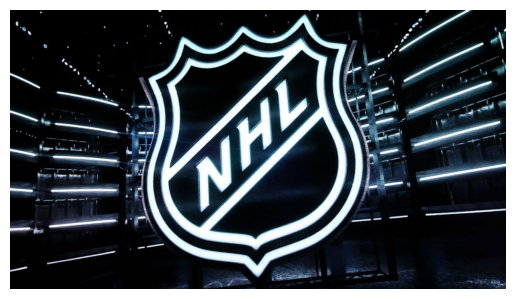

Published Date: 2024-03-07T18:05:18Z

Title: How to watch 2024 NHL trade deadline coverage on ESPN

Summarized Texts:
- The 2024 NHL trade deadline is quickly approaching! Keep up with the latest deals by checking out related coverage from ESPN.
URL: https://www.espn.com/nhl/story/_/id/39675035/how-watch-2024-nhl-trade-deadline-coverage-espn
--------------------------------------------------

1/1 [==============================] - 1s 776ms/step


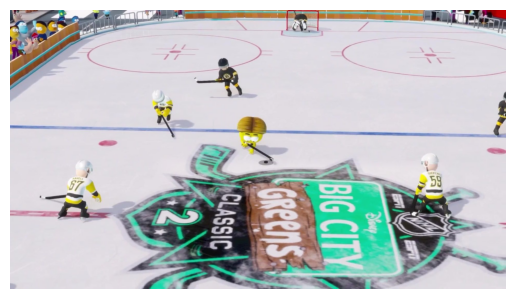

Published Date: 2024-03-07T19:35:17Z

Title: How to watch NHL Big City Greens Classic 2 on ESPN

Summarized Texts:
- Are you ready for another helping of Big City Greens? Check out how to watch the latest Bruins-Penguins animated matchup on ESPN+ and other platforms.
URL: https://www.espn.com/nhl/story/_/id/39676151/how-watch-nhl-big-city-greens-classic-2-espn
--------------------------------------------------

1/1 [==============================] - 1s 778ms/step


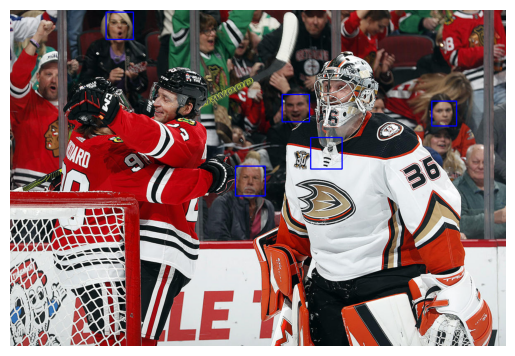

Published Date: 2024-03-13T03:22:00Z

Title: 10 observations: Connor Bedard, Blackhawks' power play stays hot in win over Ducks

Summarized Texts:
- The Blackhawks rolled past the Anaheim Ducks 7-2 on Tuesday. Here are 10 observations from the win.
URL: https://www.nbcsportschicago.com/nhl/chicago-blackhawks/10-observations-connor-bedard-blackhawks-power-play-stays-hot-in-win-over-ducks/546462/?partner=yahoo
--------------------------------------------------

1/1 [==============================] - 1s 1s/step


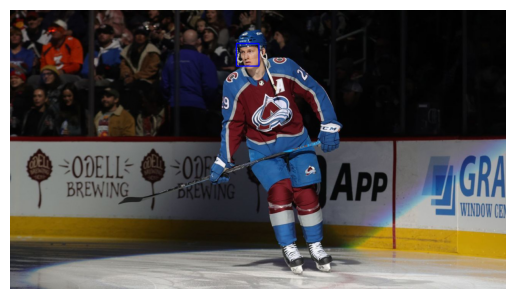

Published Date: 2024-03-01T06:08:14Z

Title: MacKinnon hits 100 points on season in Avs win

Summarized Texts:
- Colorado star Nathan MacKinnon had a goal and an assist, giving him 100 points in 61 games this season, as the Avalanche beat the lowly Chicago Blackhawks 5-0 on Thursday night.
URL: https://www.espn.com/nhl/story/_/id/39629378/mackinnon-2-points-hit-100-season-lift-avs-blackhawks
--------------------------------------------------

No image available for this article.
No image available for this article.
1/1 [==============================] - 1s 778ms/step


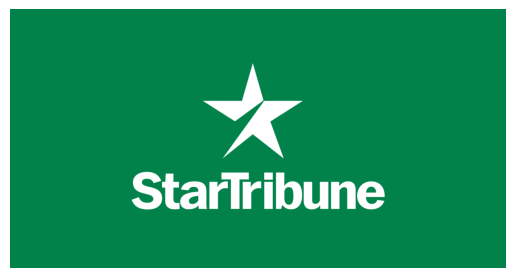

Published Date: 2024-03-06T04:48:00Z

Title: Blackhawks score 4 on power play, beat Coyotes 5-2 to end 22-game road losing streak

Summarized Texts:
- Nick Foligno scored one of Chicago's four power-play goals, and the Blackhawks ended a 22-game road losing streak with a 5-2 win over the Arizona Coyotes on Tuesday night.
URL: https://www.startribune.com/blackhawks-score-4-on-power-play-beat-coyotes-5-2-to-end-22-game-road-losing-streak/600348696/
--------------------------------------------------

1/1 [==============================] - 1s 797ms/step


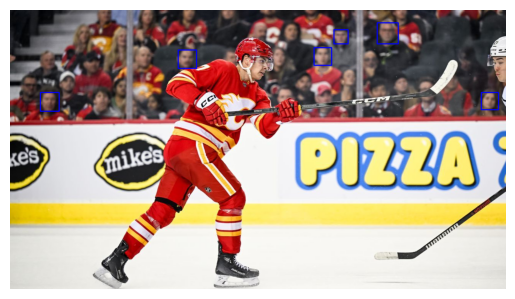

Published Date: 2024-03-15T16:50:16Z

Title: Weekend watch: Hot streaks and streaming goalies

Summarized Texts:
- What to watch for in the NHL this weekend with lineup picks, schedule advice, and adds/drops.
URL: https://www.espn.com/fantasy/hockey/story/_/id/39738420/weekend-watch-streamers-waiver-wire-goalie-picks-yegor-sharangovich-jake-allen
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 754ms/step


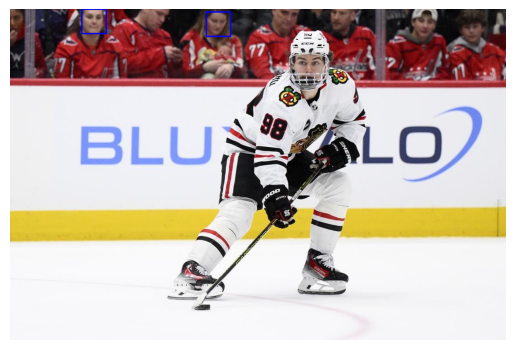

Published Date: 2024-03-10T03:15:13Z

Title: Capitals beat the Blackhawks 4-1 for another win that keeps them in the playoff race

Summarized Texts:
- WASHINGTON (AP) — Tom Wilson scored for a second consecutive game, Charlie Lindgren robbed Connor Bedard among his 29 saves, and the Washington Capitals beat the Chicago Blackhawks 4-1 on Saturday night to keep pace in the Eastern Conference playoff race. Hen…
URL: https://ca.sports.yahoo.com/news/capitals-beat-blackhawks-4-1-024707256.html
--------------------------------------------------

1/1 [==============================] - 1s 842ms/step


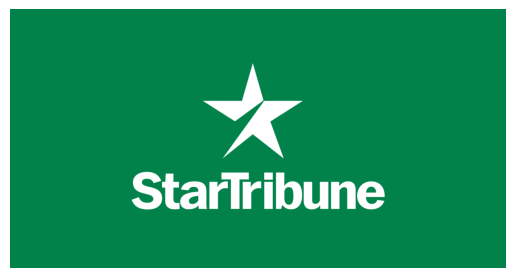

Published Date: 2024-03-24T05:24:00Z

Title: Seth Jones scores twice, including OT winner as Blackhawks rally past Sharks 5-4

Summarized Texts:
- Seth Jones scored his second goal of the game 18 seconds into overtime and the Chicago Blackhawks overcame a four-goal deficit to beat the San Jose Sharks 5-4 on Saturday night.
URL: https://www.startribune.com/seth-jones-scores-twice-including-ot-winner-as-blackhawks-rally-past-sharks-5-4/600353651/
--------------------------------------------------

1/1 [==============================] - 1s 774ms/step


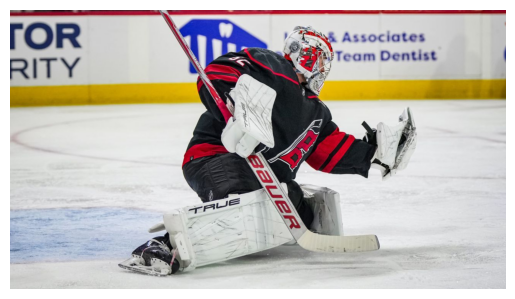

Published Date: 2024-03-25T16:22:07Z

Title: Fantasy hockey preview: Goalie streamers to win your playoff matchup

Summarized Texts:
- Notes, pickups and trends from around the NHL before your fantasy hockey lineups lock this week.
URL: https://www.espn.com/fantasy/hockey/story/_/id/39807102/fantasy-hockey-preview-stock-watch-waiver-wire-streamers-depth-chart-pyotr-kochetkov
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 856ms/step


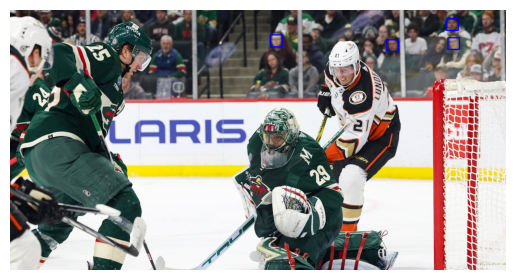

Published Date: 2024-03-19T00:57:16Z

Title: Wild at Ducks game preview: Broadcast info, stats, analysis

Summarized Texts:
- Sarah McLellan's take: The Wild have a chance to answer St. Louis and Vegas after both gained ground in the Western Conference playoff race over the past two days.
URL: https://www.startribune.com/minnesota-wild-anaheim-ducks-preview-marco-rossi/600352201/
--------------------------------------------------

1/1 [==============================] - 1s 859ms/step


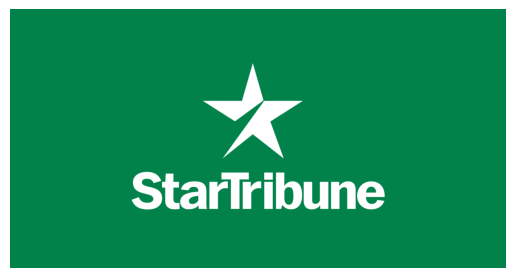

Published Date: 2024-03-03T03:05:01Z

Title: Tyson Foerster scores a pair of goals and Flyers top Senators 4-2

Summarized Texts:
- Tyson Foerster scored two goals in the span of 45 seconds, Felix Sandstrom made 24 saves in his season debut and the Philadelphia Flyers beat the Ottawa Senators 4-2 on Saturday night.
URL: https://www.startribune.com/tyson-foerster-scores-a-pair-of-goals-and-flyers-top-senators-4-2/600347808/
--------------------------------------------------

1/1 [==============================] - 1s 774ms/step


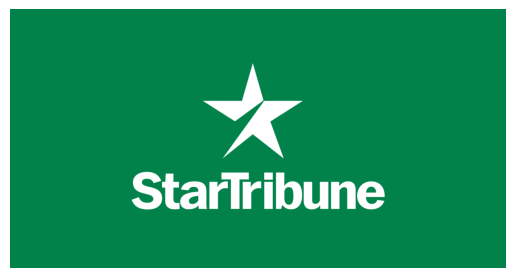

Published Date: 2024-03-01T04:38:02Z

Title: Zach Parise and Nathan MacKinnon star as the Avalanche pound the Blackhawks 5-0

Summarized Texts:
- Zach Parise had two goals and an assist, and the Colorado Avalanche beat the lowly Chicago Blackhawks 5-0 on Thursday night.
URL: https://www.startribune.com/zach-parise-and-nathan-mackinnon-star-as-the-avalanche-pound-the-blackhawks-5-0/600347330/
--------------------------------------------------

1/1 [==============================] - 1s 817ms/step


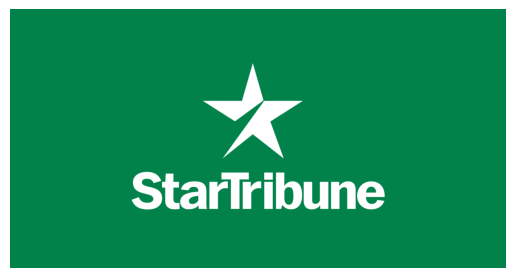

Published Date: 2024-03-27T03:10:00Z

Title: Jason Dickinson scores twice as the Chicago Blackhawks beat the Calgary Flames 3-1

Summarized Texts:
- Jason Dickinson scored twice, Petr Mrazek made 40 saves and the Chicago Blackhawks beat the Calgary Flames 3-1 on Tuesday.
URL: https://www.startribune.com/jason-dickinson-scores-twice-as-the-chicago-blackhawks-beat-the-calgary-flames-3-1/600354312/
--------------------------------------------------

1/1 [==============================] - 1s 746ms/step


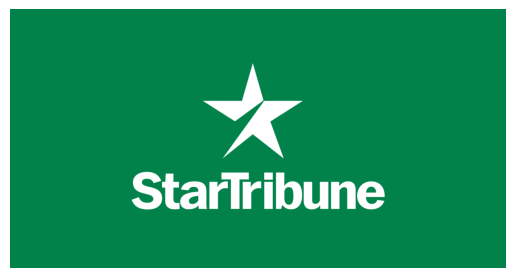

Published Date: 2024-03-16T03:23:02Z

Title: Kopitar scores twice and Talbot makes 28 saves as Kings blank Blackhawks 5-0

Summarized Texts:
- Anze Kopitar scored two of Los Angeles' four goals in the first period, and the Kings beat the Chicago Blackhawks 5-0 on Friday night.
URL: https://www.startribune.com/kopitar-scores-twice-and-talbot-makes-28-saves-as-kings-blank-blackhawks-5-0/600351685/
--------------------------------------------------

1/1 [==============================] - 1s 811ms/step


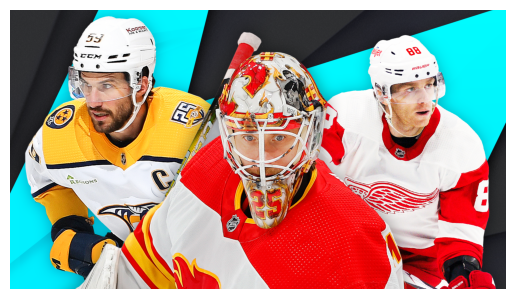

Published Date: 2024-03-01T11:03:25Z

Title: NHL Power Rankings: Most captivating game for each team in March

Summarized Texts:
- The Panthers maintain their hold atop the list one week ahead of the trade deadline. Plus, which games have some extra juice this month?
URL: https://www.espn.com/nhl/story/_/id/39625686/nhl-power-rankings-2023-2024-best-teams-standings-playoffs
--------------------------------------------------

1/1 [==============================] - 1s 752ms/step


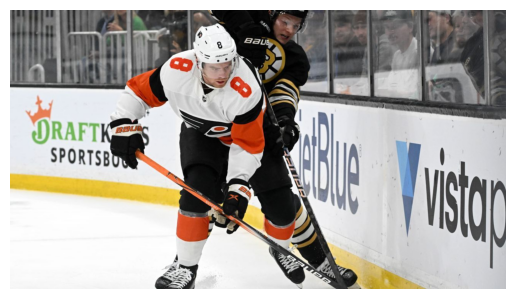

Published Date: 2024-03-20T16:57:16Z

Title: Stock watch: Cam York and other players on the rise

Summarized Texts:
- Notes, pickups, and trends from around the NHL to set your fantasy hockey lineups for the rest of the week.
URL: https://www.espn.com/fantasy/hockey/story/_/id/39769639/fantasy-hockey-stock-watch-waiver-wire-picks-streaming-march-20
--------------------------------------------------

1/1 [==============================] - 1s 838ms/step


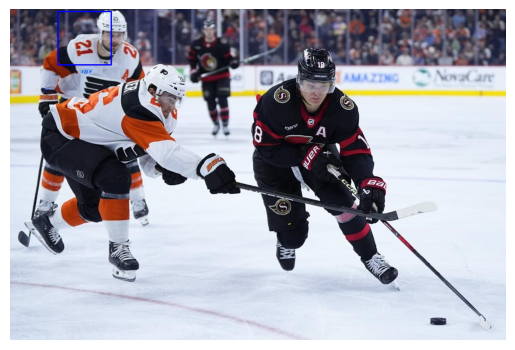

Published Date: 2024-03-03T03:10:31Z

Title: Foerster scores a pair as Flyers top Senators 4-2

Summarized Texts:
- PHILADELPHIA (AP) — Tyson Foerster scored two goals in the span of 45 seconds, Felix Sandstrom made 24 saves in his season debut and the Philadelphia Flyers beat the Ottawa Senators 4-2 on Saturday night. Foerster broke a 1-1 deadlock with 47 seconds remainin…
URL: https://ca.sports.yahoo.com/news/foerster-scores-pair-flyers-top-031031440.html
--------------------------------------------------

1/1 [==============================] - 1s 767ms/step


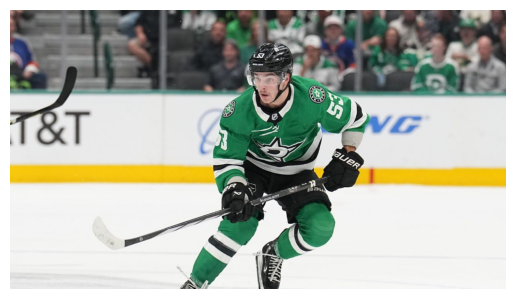

Published Date: 2024-03-19T13:52:45Z

Title: Fantasy hockey stat combos: Multi-category playoff producers

Summarized Texts:
- Need help in your matchup across two different categories fast? Sean looks at the available players who can specialize across two different categories.
URL: https://www.espn.com/fantasy/hockey/story/_/id/39764718/fantasy-hockey-stat-combos-multi-category-playoff-producers
--------------------------------------------------

1/1 [==============================] - 1s 1s/step


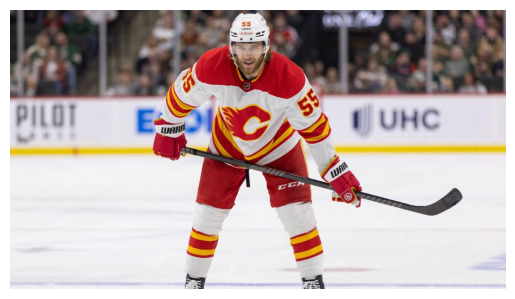

Published Date: 2024-03-01T12:27:28Z

Title: Kaplan's trade deadline buzz: Latest on Noah Hanifin, Jake Guentzel and the goalie market

Summarized Texts:
- The NHL trade deadline is one week away. Who will be the next impact player on the move? Here's what we're hearing around the league.
URL: https://www.espn.com/nhl/story/_/id/39622916/latest-trade-deadline-buzz-noah-hanifin-jake-guentzel-goalie-market
--------------------------------------------------

1/1 [==============================] - 1s 771ms/step


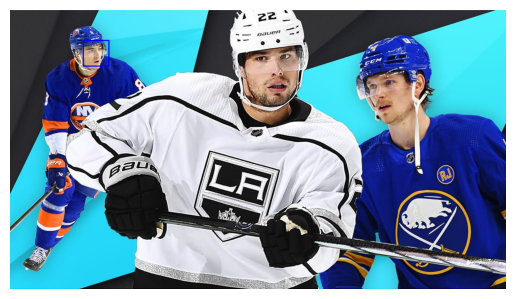

Published Date: 2024-03-15T10:21:20Z

Title: NHL Power Rankings: Panthers remain on top, plus each team's pivotal player down the stretch

Summarized Texts:
- Following the trade deadline, Florida is still the NHL's best club according to our voters. Plus, players under the spotlight down the stretch.
URL: https://www.espn.com/nhl/story/_/id/39732623/nhl-power-rankings-2023-2024-best-teams-standings-playoffs
--------------------------------------------------

1/1 [==============================] - 2s 2s/step


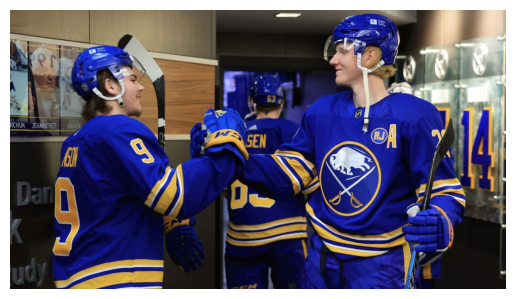

Published Date: 2024-03-14T10:22:59Z

Title: Welcome to the NHL rookie experience: How this season's class has navigated life on and off the ice

Summarized Texts:
- "It's pretty eye-opening, playing in this league," per Toronto's Matthew Knies. We asked more than a dozen rookies for insights on their new lives.
URL: https://www.espn.com/nhl/story/_/id/39722962/nhl-rookies-lifestyle-cooking-travel-video-games-faber-fantilli
--------------------------------------------------

1/1 [==============================] - 1s 791ms/step


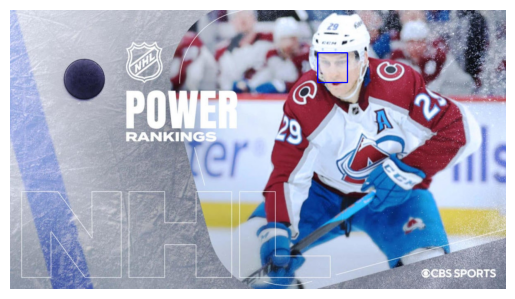

Published Date: 2024-03-20T16:01:53Z

Title: NHL Power Rankings: Nathan MacKinnon leads Avalanche to seven straight wins, No. 1 spot

Summarized Texts:
- MacKinnon and the Avs are peaking at the right time
URL: https://www.cbssports.com/nhl/news/nhl-power-rankings-nathan-mackinnon-leads-avalanche-to-seven-straight-wins-no-1-spot/
--------------------------------------------------

1/1 [==============================] - 1s 769ms/step


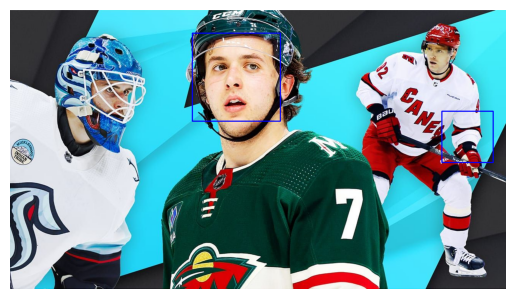

Published Date: 2024-03-22T10:08:45Z

Title: NHL Power Rankings: Fantasy playoff performers to target from each team

Summarized Texts:
- The Panthers are still on top of the list as voted on by our panel. Plus, here's one player from each team to help you win a fantasy title.
URL: https://www.espn.com/nhl/story/_/id/39779565/nhl-power-rankings-2023-2024-best-teams-standings-fantasy
--------------------------------------------------

1/1 [==============================] - 1s 810ms/step


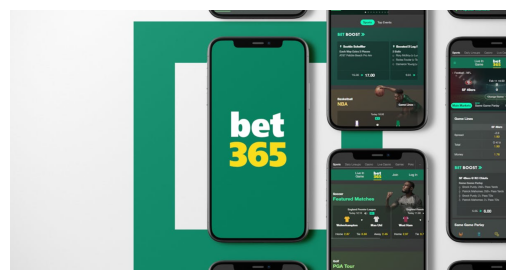

Published Date: 2024-02-29T16:09:46Z

Title: bet365 bonus code STARXLM: $150 bonus, $1K Safety Net for NBA Thursday

Summarized Texts:
- The app has two great offers for matchups like Warriors-Knicks
URL: https://www.startribune.com/bet365-bonus-code-starxlm-150-bonus-1k-safety-net-for-nba-thursday/600347126/
--------------------------------------------------

1/1 [==============================] - 1s 774ms/step


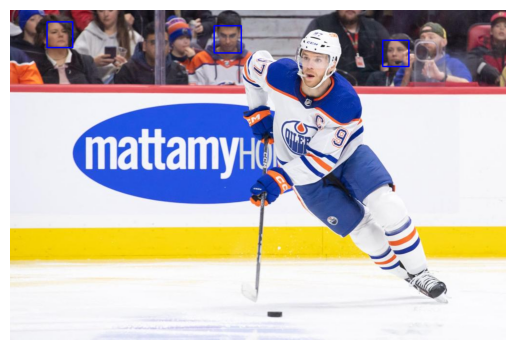

Published Date: 2024-03-25T16:23:54Z

Title: 2024 NHL awards predictions: Art Ross Trophy, Hart Trophy odds, picks, best bets

Summarized Texts:
- The points race continues as the 2023-24 MVP remains in the balance, with three clear-cut contenders making a case for the Hart Trophy.
URL: https://nypost.com/2024/03/25/sports/2024-nhl-awards-predictions-art-ross-trophy-hart-trophy-picks/
--------------------------------------------------

1/1 [==============================] - 1s 825ms/step


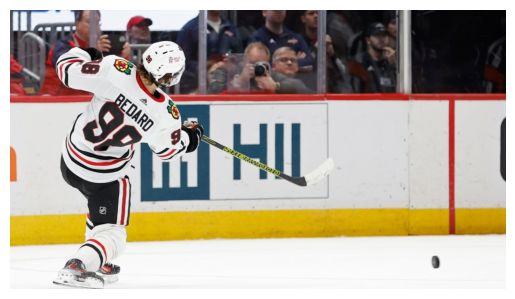

Published Date: 2024-03-10T20:30:43Z

Title: Coyotes vs. Blackhawks Free Live Stream: Time, TV Channel, How to Watch, Odds

Summarized Texts:
- The Arizona Coyotes will face the Chicago Blackhawks on Sunday at the United Center. Arizona is fresh off a 4-0 victory over the Red Wings. Goaltender Connor Ingram was excellent in in the game wit…
URL: https://ftw.usatoday.com/2024/03/coyotes-vs-blackhawks-free-live-stream-time-tv-channel-how-to-watch-odds
--------------------------------------------------

1/1 [==============================] - 1s 772ms/step


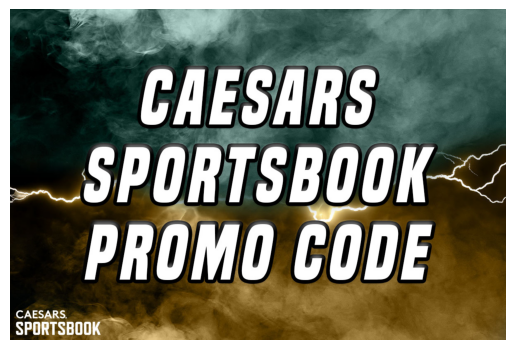

Published Date: 2024-02-29T22:01:01Z

Title: Caesars Sportsbook Promo Code NEWSWK1000: $1K First-Bet for NBA, NHL

Summarized Texts:
- New customers can sign up with our Caesars Sportsbook promo code NEWSWK1000 to bet up to $1,000 on any NBA or NHL game.
URL: https://www.newsweek.com/caesars-sportsbook-promo-code-newswk1000-1k-first-bet-nba-nhl-1874795
--------------------------------------------------

1/1 [==============================] - 1s 816ms/step


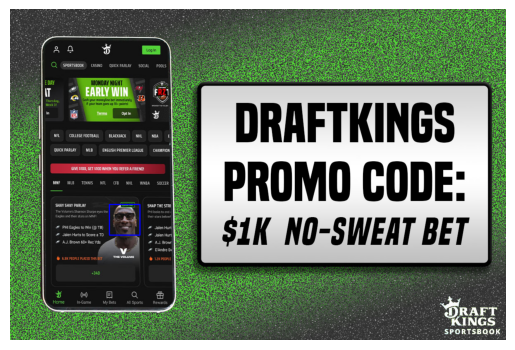

Published Date: 2024-02-29T21:15:01Z

Title: DraftKings Promo Code: No-Sweat Bet Up to $1K for Any NBA, NHL Game

Summarized Texts:
- New players can activate the current DraftKings promo code offer to place a $1K no-sweat bet on any NBA or NHL game.
URL: https://www.newsweek.com/draftkings-promo-code-no-sweat-bet-1k-any-nba-nhl-game-1874545
--------------------------------------------------

1/1 [==============================] - 1s 852ms/step


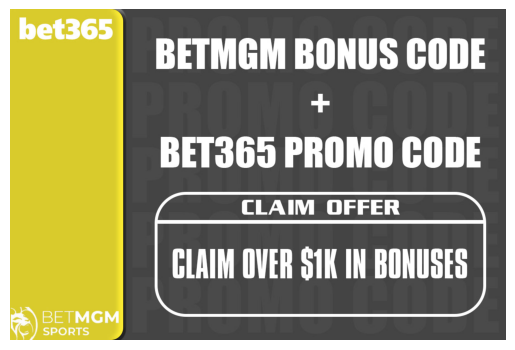

Published Date: 2024-02-29T20:27:20Z

Title: BetMGM Bonus Code + Bet365 Promo Code: Get Over $1K in NBA, NHL Bonuses

Summarized Texts:
- Use our BetMGM bonus code NEWSWEEK150 and bet365 promo code NEWSXLM to snag over $1K in bonuses before the weekend.
URL: https://www.newsweek.com/betmgm-bonus-code-bet365-promo-code-get-over-1k-nba-nhl-bonuses-1874766
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 869ms/step


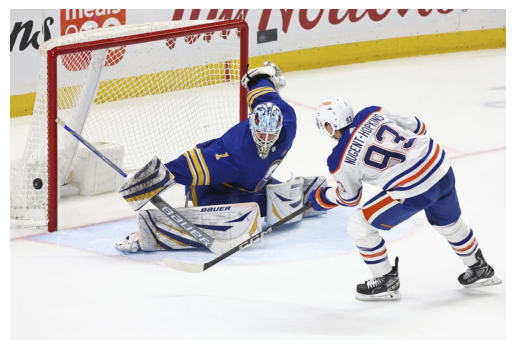

Published Date: 2024-03-10T06:33:27Z

Title: NHL roundup: Tuch scores in shootout as Sabres outlast Oilers 3-2

Summarized Texts:
- BUFFALO, N.Y. (AP) — Alex Tuch scored the decisive shootout goal and the Buffalo Sabres overcame a two-goal deficit and a disallowed overtime goal in a 3-2 win over the Edmonton Oilers on Saturday. Jacob Bryson scored the tying goal with 8:21 remaining and Ta…
URL: https://ca.sports.yahoo.com/news/nhl-roundup-tuch-scores-shootout-063327069.html
--------------------------------------------------

1/1 [==============================] - 1s 787ms/step


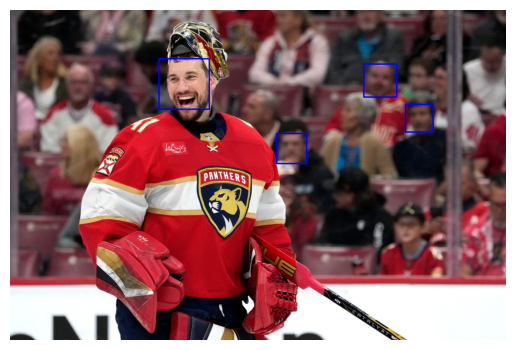

Published Date: 2024-03-03T11:12:29Z

Title: Steve Conroy’s NHL Power Rankings: Bruins are No. 4

Summarized Texts:
- We are days away from the March 8 deadline and knowing the full makeup of the Stanley Cup hopefuls. While some pretenders have exposed their true nature, a number of bubble teams are still treading water, still deciding how important making the playoffs reall…
URL: https://www.bostonherald.com/2024/03/03/steve-conroys-nhl-power-rankings-bruins-are-no-4/
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 1s/step


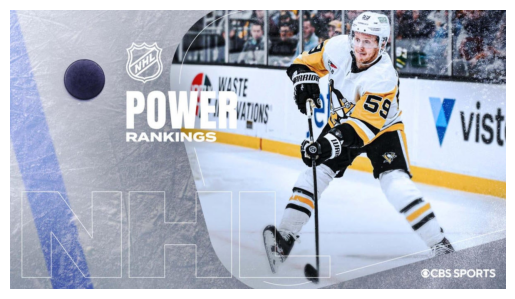

Published Date: 2024-02-28T16:49:24Z

Title: NHL Power Rankings: Making buy or sell decisions for each team ahead of 2024 trade deadline

Summarized Texts:
- Every team has some big decisions to make over the next week
URL: https://www.cbssports.com/nhl/news/nhl-power-rankings-making-buy-or-sell-decisions-for-each-team-ahead-of-2024-trade-deadline/
--------------------------------------------------

1/1 [==============================] - 1s 820ms/step


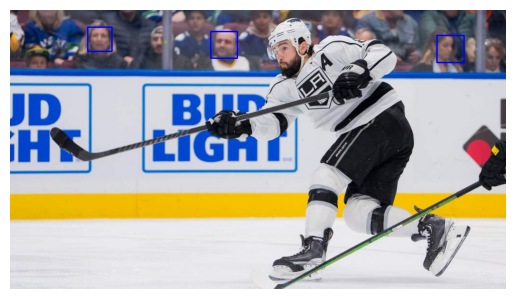

Published Date: 2024-03-15T23:35:15Z

Title: Kings vs. Blackhawks Free Live Stream: Time, TV Channel, How to Watch, Odds

Summarized Texts:
- The Los Angeles Kings will face the Chicago Blackhawks on Friday at the United Center. Los Angeles has alternated wins and losses recently. They are in line to make the playoffs if they finish the …
URL: https://ftw.usatoday.com/2024/03/kings-vs-blackhawks-free-live-stream-time-tv-channel-how-to-watch-odds
--------------------------------------------------

1/1 [==============================] - 1s 787ms/step


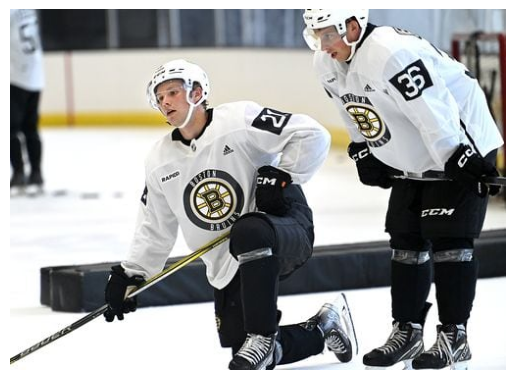

Published Date: 2024-03-02T15:16:47Z

Title: Here’s a look at some of the Bruins’ top youngsters with the trade deadline approaching

Summarized Texts:
- Boston is short on draft picks, which leaves its prospect pool as its biggest commodity.
URL: https://www.bostonglobe.com/2024/03/02/sports/sunday-hockey-notes-bruins-trade-deadline/
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 822ms/step


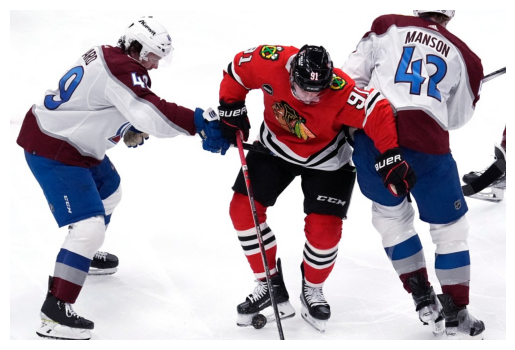

Published Date: 2024-03-04T22:49:29Z

Title: Avalanche players, Connor Bedard downplay Josh Manson’s slash in lead up to potentially spicy rematch

Summarized Texts:
- Connor Bedard and multiple Avalanche players downplayed a slash by Josh Manson on the Chicago phenom last week ahead of a rematch Monday at Ball Arena.
URL: https://www.denverpost.com/2024/03/04/avalanche-bedard-manson-byram-blackhawks/
--------------------------------------------------

No image available for this article.
No image available for this article.
1/1 [==============================] - 1s 793ms/step


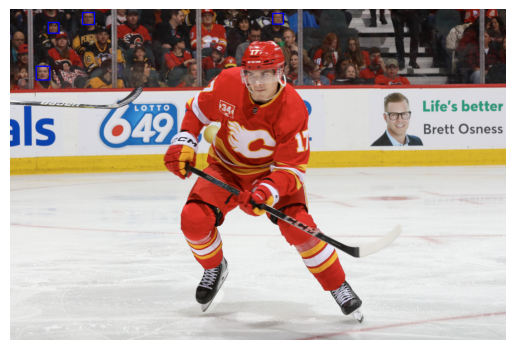

Published Date: 2024-03-15T20:22:57Z

Title: Fantasy Hockey Waiver Wire: These players could help to ice the competition

Summarized Texts:
- With so many NHL teams' late-season rotations set, one of these players may help you shoot for a fantasy title.
URL: https://sports.yahoo.com/fantasy-hockey-waiver-wire-these-players-could-help-to-ice-the-competition-202257722.html
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 883ms/step


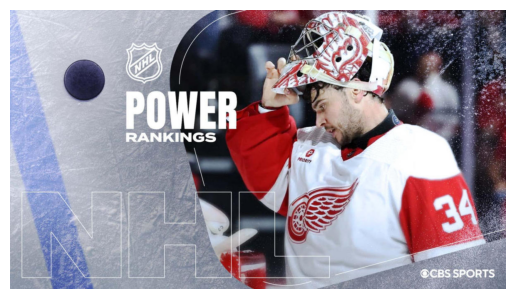

Published Date: 2024-03-13T17:42:01Z

Title: NHL Power Rankings: Red Wings in free fall as Stanley Cup Playoffs approach

Summarized Texts:
- Detroit is headed in the wrong direction at the wrong time of year
URL: https://www.cbssports.com/nhl/news/nhl-power-rankings-red-wings-in-free-fall-as-stanley-cup-playoffs-approach/
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 790ms/step


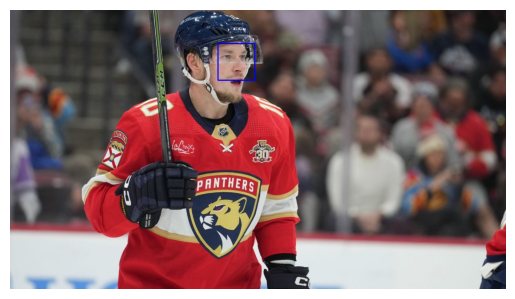

Published Date: 2024-03-11T10:23:36Z

Title: How the NHL trade deadline impacts the playoffs, draft lottery for all 32 teams

Summarized Texts:
- It was a wild week leading up to the deadline. We grade each GM, and examine what it means moving forward for each club this spring.
URL: https://www.espn.com/nhl/insider/insider/story/_/id/39699238/nhl-trade-deadline-2024-grades-playoffs-draft-lottery-teams
--------------------------------------------------

1/1 [==============================] - 1s 829ms/step


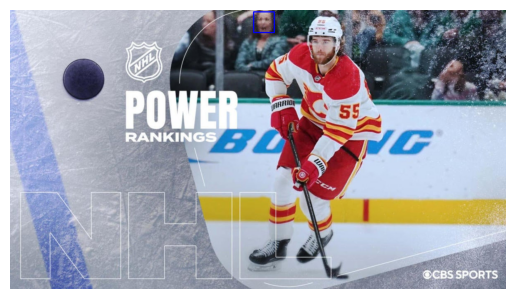

Published Date: 2024-03-06T15:15:03Z

Title: NHL Power Rankings: Identifying top trade deadline priority for every team as Panthers hold down top spot

Summarized Texts:
- Teams are about to be wheeling and dealing, and Flames defenseman Noah Hanifin may be among the players moved
URL: https://www.cbssports.com/nhl/news/nhl-power-rankings-identifying-top-trade-deadline-priority-for-every-team-as-panthers-hold-down-top-spot/
--------------------------------------------------

No image available for this article.
No image available for this article.
No image available for this article.
No image available for this article.
1/1 [==============================] - 1s 1s/step


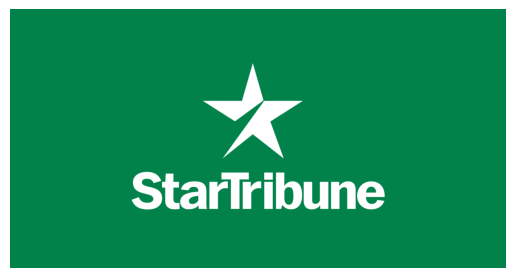

Published Date: 2024-03-18T00:52:00Z

Title: Donato, Korchinski, Anderson score score in 1:23 span to rally Blackhawks to 5-2 win over Sharks

Summarized Texts:
- Ryan Donato, Kevin Korchinski and Joey Anderson scored in a 1:23 span of the third period, and the Chicago Blackhawks beat the San Jose Sharks 5-2 on Sunday night.
URL: https://www.startribune.com/donato-korchinski-anderson-score-score-in-123-span-to-rally-blackhawks-to-5-2-win-over-sharks/600351944/
--------------------------------------------------

No image available for this article.
No image available for this article.
No image available for this article.
1/1 [==============================] - 1s 766ms/step


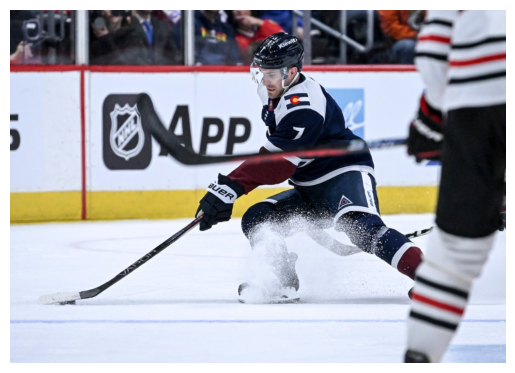

Published Date: 2024-03-05T04:47:12Z

Title: Justus Annunen, Nathan MacKinnon help Avalanche blast Blackhawks again

Summarized Texts:
- One of the most hyped first-year players in NHL history arrived at Ball Arena on Monday night, and for the second time in five days Colorado Avalanche rookie goaltender Justus Annunen outshined him.
URL: https://www.denverpost.com/2024/03/04/avalanche-beat-blackhawks-justus-annunen-nathan-mackinnon/
--------------------------------------------------

No image available for this article.
1/1 [==============================] - 1s 824ms/step


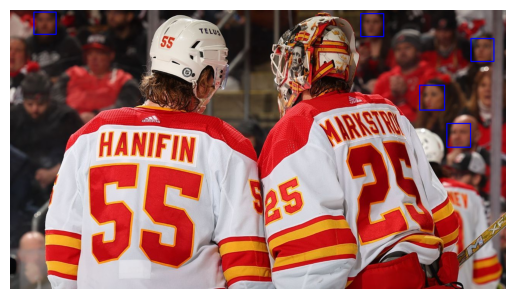

Published Date: 2024-02-29T11:12:46Z

Title: NHL trade deadline preview for all 32 teams: Players, picks in play, plus what they should do

Summarized Texts:
- Deadline season had been quiet for a while, until Chris Tanev was sent to Dallas. What other moves are in store? Here's where each team stands.
URL: https://www.espn.com/nhl/insider/insider/story/_/id/39615918/nhl-trade-deadline-2024-teams-players-preview-contracts-picks
--------------------------------------------------

1/1 [==============================] - 1s 770ms/step


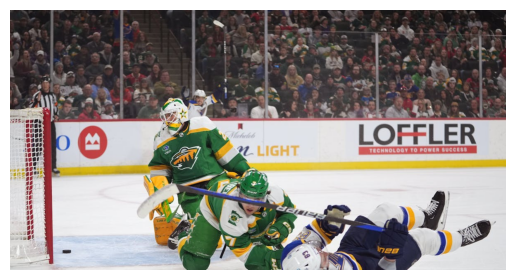

Published Date: 2024-03-23T20:54:14Z

Title: Wild fall to Blues 5-4 in overtime to lose more ground in playoff hunt

Summarized Texts:
- They blew two leads and have the potential to fall further behind with a four-day break coming up.
URL: https://www.startribune.com/minnesota-wild-st-louis-blues-xcel-energy-center-nhl-western-conference-wild-card-playoff/600353584/
--------------------------------------------------

No image available for this article.
No image available for this article.
No image available for this article.
1/1 [==============================] - 1s 821ms/step


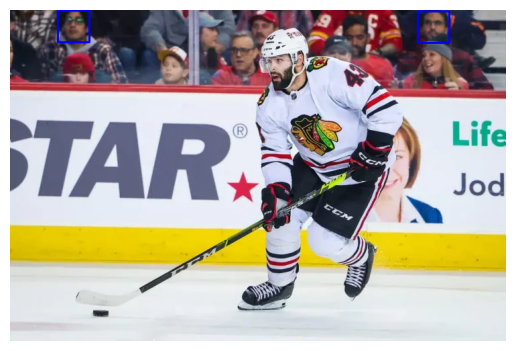

Published Date: 2024-03-11T16:00:09Z

Title: Blackhawks centre Colin Blackwell notches first career NHL hat trick

Summarized Texts:
- Chicago Blackhawks centre Colin Blackwell of Lawrence, Massachusetts recorded his first career National Hockey League hat trick on Sunday. He...
The post Blackhawks centre Colin Blackwell notches first career NHL hat trick appeared first on The Sports Daily.
URL: https://thesportsdaily.com/news/blackhawks-centre-colin-blackwell-notches-first-career-nhl-hat-trick/
--------------------------------------------------



In [15]:


def main():
    person_name = input("Enter the person's name: ")

    # Fetch articles and print information
    articles = fetch_articles(person_name)

    for article in articles:
        title = article.get('title', 'No title available')
        description = article.get('description', 'No description available')
        url = article.get('url', 'No URL available')
        url_to_image = article.get('urlToImage', None)
        published_at = article.get('publishedAt', 'No date available')

        # Download the image associated with the article
        if url_to_image:
            response = requests.get(url_to_image)
            if response.status_code == 200:
                # Perform face detection on the downloaded image
                image_array = cv2.imdecode(np.frombuffer(response.content, np.uint8), -1)
                faces, _ = detect_and_recognize_faces(image_array)

                # Draw bounding boxes around detected faces
                for (x, y, w, h) in faces:
                    cv2.rectangle(image_array, (x, y), (x+w, y+h), (255, 0, 0), 2)

                # Perform text summarization using LSTM (dummy example)
                texts = [f"{description}"]  # Include only description in the text
                lstm_summaries = summarize_text_with_lstm(texts)

                # Display the original image with bounding boxes
                plt.imshow(cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB))
                plt.axis('off')
                plt.show()

                print(f'Published Date: {published_at}\n')
                print(f'Title: {title}\n')
                print(f'Summarized Texts:')
                for summary in lstm_summaries:
                    print(f'- {summary}')
                print(f'URL: {url}\n{"-"*50}\n')

            else:
                print(f"Failed to download image from {url_to_image}")
        else:
            print("No image available for this article.")

if __name__ == "__main__":
    main()


Enter the person's name: Connor bedard


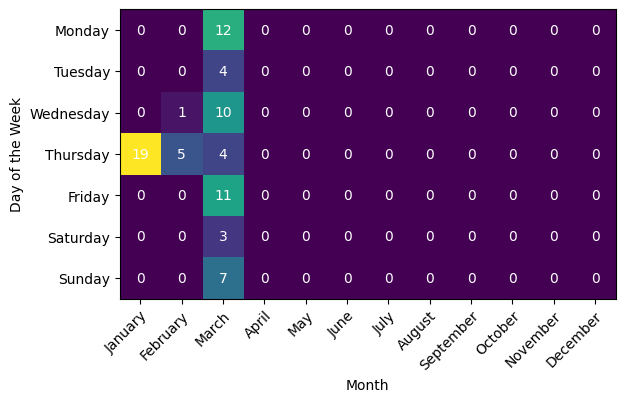

In [ ]:
from datetime import datetime

def plot_bar_graph(bar_graph_data, months, days_of_week):
    # Create the bar graph plot
    fig, ax = plt.subplots()
    im = ax.imshow(bar_graph_data, cmap='viridis')

    # Set x-axis and y-axis labels
    ax.set_xticks(np.arange(len(months)))
    ax.set_yticks(np.arange(len(days_of_week)))
    ax.set_xticklabels(months)
    ax.set_yticklabels(days_of_week)

    # Rotate the tick labels and set their alignment
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    # Loop over data dimensions and create text annotations
    for i in range(len(days_of_week)):
        for j in range(len(months)):
            text = ax.text(j, i, int(bar_graph_data[i, j]), ha="center", va="center", color="w")

    # Set axis labels
    ax.set_xlabel('Month')
    ax.set_ylabel('Day of the Week')

    # Display the plot
    plt.show()
def main():
    person_name = input("Enter the person's name: ")

    # Fetch articles and print information
    articles = fetch_articles(person_name)

    # Initialize the bar graph data structure
    months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
    days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    bar_graph_data = np.zeros((len(days_of_week), len(months)))

    for article in articles:
        published_at = article.get('publishedAt')
        if published_at:
            # Parse the published date
            published_date = datetime.strptime(published_at, "%Y-%m-%dT%H:%M:%SZ")

            # Increment the corresponding entry in the bar graph
            bar_graph_data[published_date.weekday(), published_date.month - 1] += 1

    # Call the graph function
    plot_bar_graph(bar_graph_data, months, days_of_week)

if __name__ == "__main__":
    main()

In [ ]:
from tabulate import tabulate
def print_dates_table(published_dates):
    # Print a separate table for all the published dates
    print("\nPublished Dates Table:")
    print(tabulate(published_dates, headers=['Published Date']))
def main():
    person_name = input("Enter the person's name: ")

    # Fetch articles and print information
    articles = fetch_articles(person_name)

    # Collect published dates for a separate table
    published_dates = []

    for article in articles:

        published_at = article.get('publishedAt', 'No date available')
        published_dates.append([published_at])


    print_dates_table(published_dates)

if __name__ == "__main__":
    main()

Enter the person's name: Connor bedard

Published Dates Table:
Published Date
--------------------
2024-03-01T18:48:14Z
2024-03-14T13:29:56Z
2024-03-12T00:57:57Z
2024-03-11T01:01:01Z
2024-03-11T00:39:00Z
2024-03-18T18:24:03Z
2024-03-11T02:27:00Z
2024-03-13T03:25:00Z
2024-03-13T20:18:25Z
2024-03-01T20:01:18Z
2024-03-07T18:05:18Z
2024-03-07T19:35:17Z
2024-03-13T03:22:00Z
2024-03-01T06:08:14Z
2024-03-13T04:29:00Z
2024-03-18T17:43:22Z
2024-03-06T04:48:00Z
2024-03-15T16:50:16Z
2024-03-11T02:09:35Z
2024-03-10T03:15:13Z
2024-03-24T05:24:00Z
2024-03-25T16:22:07Z
1970-01-01T00:00:00Z
2024-03-19T00:57:16Z
2024-03-03T03:05:01Z
2024-03-01T04:38:02Z
2024-03-27T03:10:00Z
2024-03-16T03:23:02Z
2024-03-01T11:03:25Z
2024-03-20T16:57:16Z
2024-03-03T03:10:31Z
2024-03-19T13:52:45Z
2024-03-01T12:27:28Z
2024-03-15T10:21:20Z
2024-03-14T10:22:59Z
2024-03-20T16:01:53Z
2024-03-22T10:08:45Z
2024-02-29T16:09:46Z
2024-03-25T16:23:54Z
2024-03-10T20:30:43Z
2024-02-29T22:01:01Z
2024-02-29T21:15:01Z
2024-02-29T20:27:20